In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA

## 1. Load the dataset and make your preprocessing like normalizing the data.

In [16]:
mnist = fetch_openml('Fashion-MNIST', version=1, cache=True, parser='auto')

In [9]:
!pip install python-mnist

  Obtaining dependency information for python-mnist from https://files.pythonhosted.org/packages/64/f0/6086b84427c3bf156ec0b3c2f9dfc1d770b35f942b9ed8a64f5229776a80/python_mnist-0.7-py2.py3-none-any.whl.metadata


In [17]:
# Ensure mnist.data is a pandas DataFrame
X_all = mnist.data
y_all = mnist.target

# Select 10000 images randomly
indices = np.random.choice(len(X_all), 10000, replace=False)
X = X_all.iloc[indices].to_numpy() / 255.0
y = y_all.iloc[indices].to_numpy()

print(X.shape, y.shape)


# We just want the first two principal components
pca = PCA(n_components=2)

# We get the components by 
# calling fit_transform method with our data
pca_components = pca.fit_transform(X)

(10000, 784) (10000,)


GMM scores lower than both k-means and hierarchical clustering in terms of ARI and silhouette scores


## 2. Apply PCA to the data and get the first two principal components.

In [18]:
# We just want the first two principal components
pca = PCA(n_components=2)

# We get the components by 
# calling fit_transform method with our data
pca_components = pca.fit_transform(X)

## 3. Using the first two principal components, draw a graph of the data by coloring and labeling the data points as we did in the checkpoint

In [19]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

## 4. Do you think PCA solution is satisfactory? Can you distinguish between different classes easily?

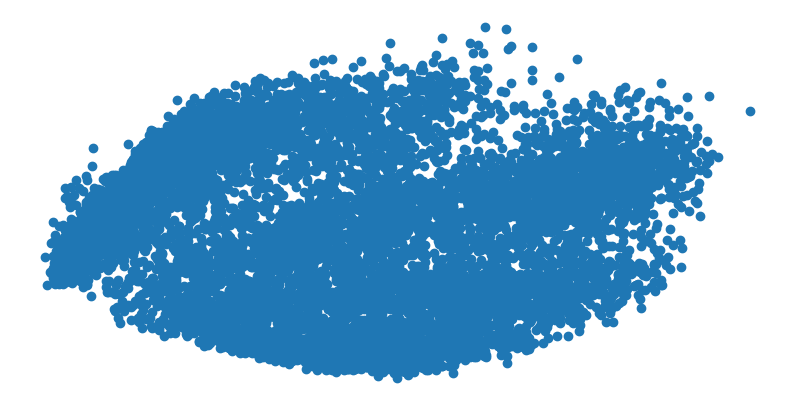

In [20]:
plt.figure(figsize=(10,5))
plt.scatter(pca_components[:, 0], pca_components[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()